In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.4 (python 3.8.12) on 2022-04-23 10:57.
Running scvelo 0.2.4 (python 3.8.12) on 2022-04-23 10:57.


In [2]:
# define sample metadata. Usually read from a file.
exclude_genes = ['Rpl', 'Rps', 'Trav', 'Traj', 'Trbj', 'Trbv','Mrp','Fau','Dap3','Uba52','Ighv', 'Igkv', 'Iglv']


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


In [4]:
out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/cellphonedb/human_sub'

In [5]:
adata =sc.read_h5ad(out_path+'/sub_velocity_human.h5ad')

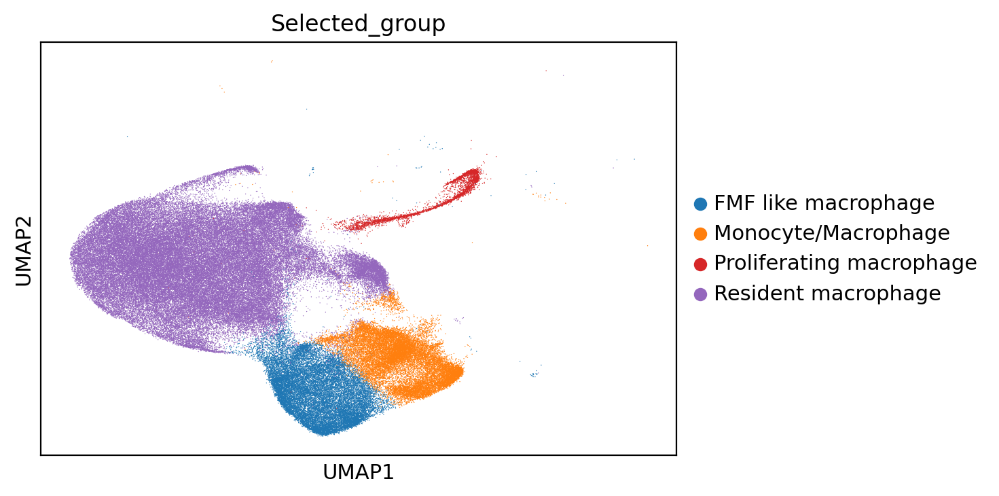

In [6]:
sc.pl.umap(adata, color = 'Selected_group')

In [7]:
import cellrank as cr
scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [8]:
import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [9]:
adata

AnnData object with n_obs × n_vars = 128939 × 27210
    obs: 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts', 'Cell_Type', 'condition', 'SatM_like', 'human_clusters', 'Selected_group', 'Defined_groups', 'velocity_self_transition', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'En

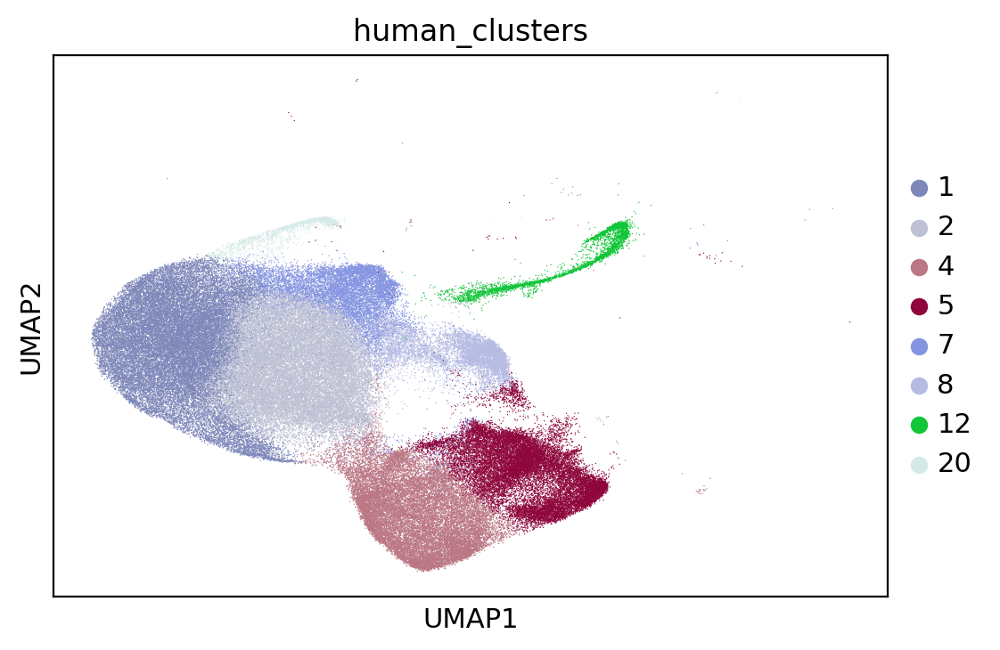

In [10]:
sc.pl.umap(adata, color = 'human_clusters')

In [12]:
sc.pp.neighbors(adata)

recovering dynamics (using 24/384 cores)


  0%|          | 0/61 [00:00<?, ?gene/s]

    finished (0:13:45) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:53) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/384 cores)


  0%|          | 0/128939 [00:00<?, ?cells/s]

    finished (0:01:28) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:47) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


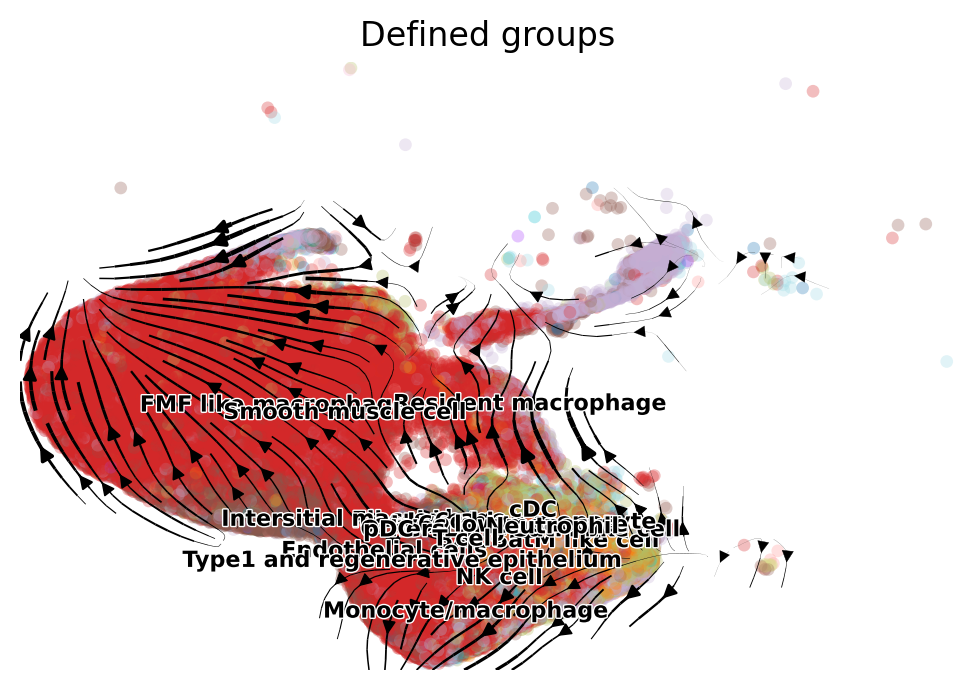

In [13]:
scv.tl.recover_dynamics(adata, n_jobs=24)
scv.tl.velocity(adata, mode="dynamical")

scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(
   adata, basis="umap", legend_fontsize=8, color ='Defined_groups',smooth=0.8, min_mass=2
)


In [14]:
adata.write(out_path+'/human_subset_0421.h5ad')

In [15]:
cr.tl.terminal_states(adata, cluster_key='Defined_groups', weight_connectivities=0.2,n_jobs=24,n_states=7)


Accessing `adata.obsp['T_fwd']`


<ipython-input-15-f0cd3c32265a>:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata, cluster_key='Defined_groups', weight_connectivities=0.2,n_jobs=24,n_states=7)
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/128939 [00:00<?, ?cell/s]

Setting `softmax_scale=1.7017`


  0%|          | 0/128939 [00:00<?, ?cell/s]

    Finish (0:01:30)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000073e+00 -4.4000364554063551e-05 2.9015071557340552e-03 1.4415177059398405e-03 2.9510528029649970e-03 -1.3331444734070155e-03 2.2314906052935905e-03 3.0043102395100325e-03 
0.0000000000000000e+00 9.9873084907066401e-01 4.9089360478101799e-05 7.9053426698627302e-06 9.5032349704525911e-05 -8.0865748220531261e-05 3.3980199749757638e-04 3.5222450340364949e-04 
0.0000000000000000e+00 0.0000000000000000e+00 9.9496291778992119e-01 -6.5095227668597290e-06 -1.8990085924074473e-03 1.4914195147069900e-03 2.1705618797980092e-04 2.5634255878619072e-04 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.9476113402676758e-01 -1.4982261581003300e-03 1.1204251278772543e-03 -7.2632815217365908e-05 -1.3960839098837568e-04 
0.0000000000000000e+0

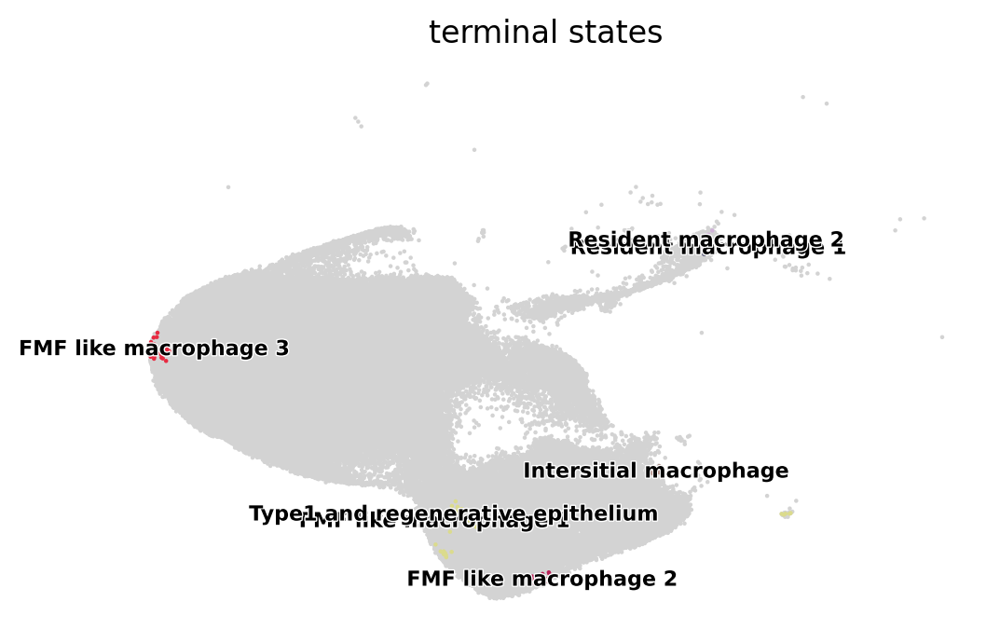

In [16]:
cr.pl.terminal_states(adata, discrete=True,legend_fontsize=8)

Accessing `adata.obsp['T_bwd']`


/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-17-ebabc894cea9>:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key='Defined_groups',n_jobs=24,n_states=1)
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/128939 [00:00<?, ?cell/s]

Setting `softmax_scale=1.7017`


  0%|          | 0/128939 [00:00<?, ?cell/s]

    Finish (0:00:53)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:47)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


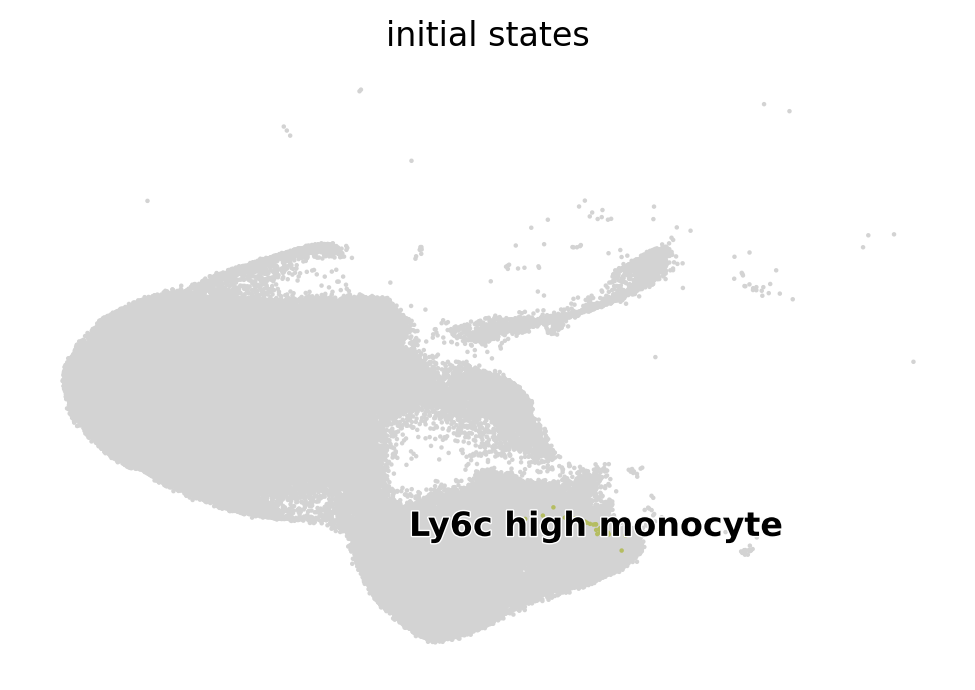

In [17]:
cr.tl.initial_states(adata, cluster_key='Defined_groups',n_jobs=24,n_states=1)
cr.pl.initial_states(adata, discrete=True)

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-18-4ec1421c6596>:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


Computing absorption probabilities


  0%|          | 0/7 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:10)


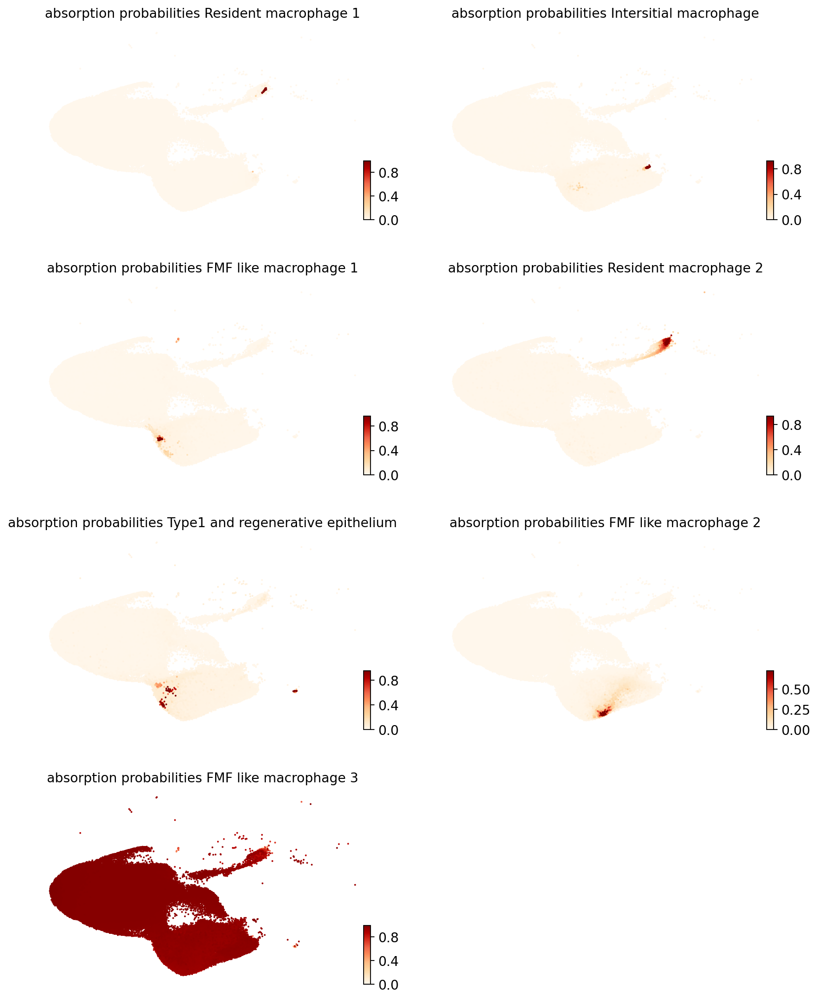

In [18]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False,ncols=2,cmap='OrRd')

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


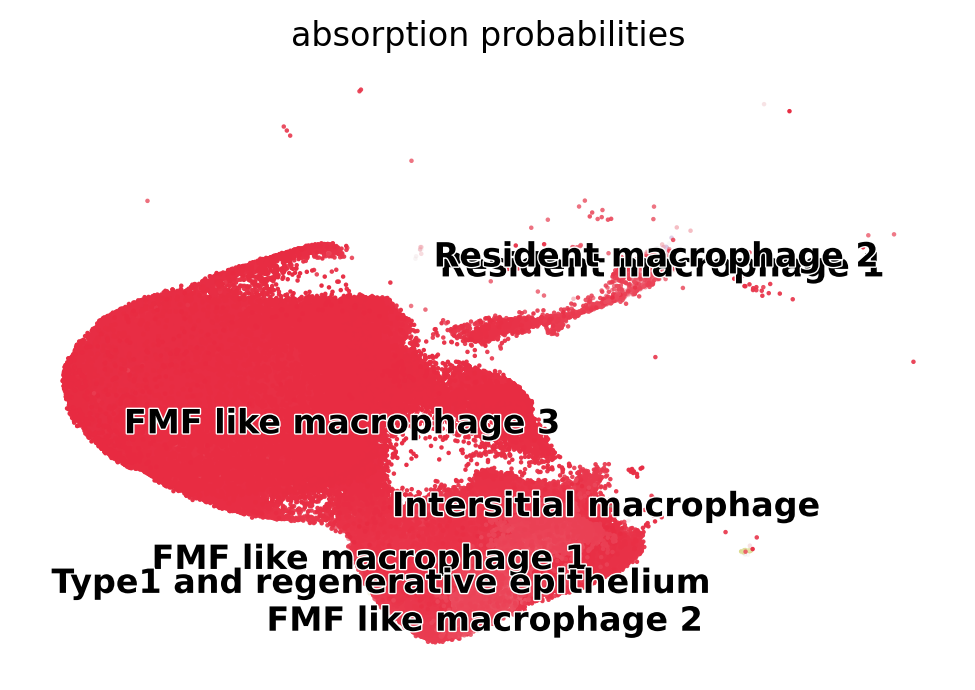

In [19]:
cr.pl.lineages(adata, discrete=True)

In [20]:
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:05:01) --> added 
    'latent_time', shared time (adata.obs)


In [21]:
scv.tl.paga(
    adata,
    groups="Selected_group",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="latent_time",
)

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


running PAGA using priors: ['latent_time', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:27) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/networkx/drawing/nx_pylab.py:717: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  edge_collection = mpl.collections.LineCollection(


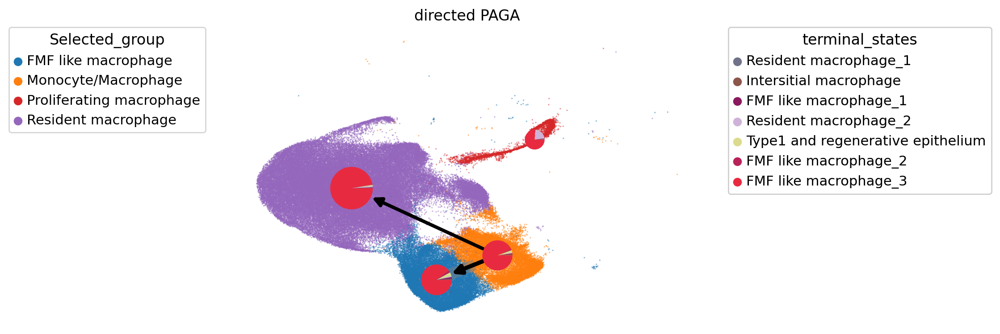

In [22]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="Selected_group",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=4,
    edge_width_scale=4,
    max_edge_width=10,
    title="directed PAGA",
)

In [23]:
cr.tl.lineage_drivers(adata)

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-23-b827be8b05bf>:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:34)


,Resident macrophage_1_corr,Resident macrophage_1_pval,Resident macrophage_1_qval,Resident macrophage_1_ci_low,Resident macrophage_1_ci_high,Intersitial macrophage_corr,Intersitial macrophage_pval,Intersitial macrophage_qval,Intersitial macrophage_ci_low,Intersitial macrophage_ci_high,...,FMF like macrophage_2_corr,FMF like macrophage_2_pval,FMF like macrophage_2_qval,FMF like macrophage_2_ci_low,FMF like macrophage_2_ci_high,FMF like macrophage_3_corr,FMF like macrophage_3_pval,FMF like macrophage_3_qval,FMF like macrophage_3_ci_low,FMF like macrophage_3_ci_high
HIST1H3C,0.340958,0.0,NaN,0.336125,0.345773,-0.003351,2.288865e-01,NaN,-0.008809,0.002107,...,-0.009367,7.696936e-04,NaN,-0.014824,-0.003909,-0.217426,0.0,NaN,-0.222620,-0.212219
HIST1H3B,0.239591,0.0,NaN,0.234439,0.244729,-0.004751,8.803049e-02,NaN,-0.010209,0.000708,...,-0.009663,5.204420e-04,NaN,-0.015121,-0.004205,-0.261799,0.0,NaN,-0.266876,-0.256708
HIST1H2AI,0.203315,0.0,NaN,0.198077,0.208542,0.000216,9.380528e-01,NaN,-0.005242,0.005675,...,-0.004646,9.522538e-02,NaN,-0.010105,0.000812,-0.134437,0.0,NaN,-0.139793,-0.129073
HIST1H4F,0.198831,0.0,NaN,0.193583,0.204068,0.022316,1.106506e-15,NaN,0.016860,0.027771,...,-0.003506,2.081211e-01,NaN,-0.008964,0.001953,-0.117202,0.0,NaN,-0.122581,-0.111815
KNL1,0.171764,0.0,NaN,0.166462,0.177057,-0.005373,5.370236e-02,NaN,-0.010831,0.000086,...,-0.017590,2.668606e-10,NaN,-0.023046,-0.012133,-0.375566,0.0,NaN,-0.380244,-0.370867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL158801.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TMCO5A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AC068481.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VWC2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
Terminals = adata.obs['terminal_states'].unique().tolist()

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [27]:
Terminals.remove(np.NaN)

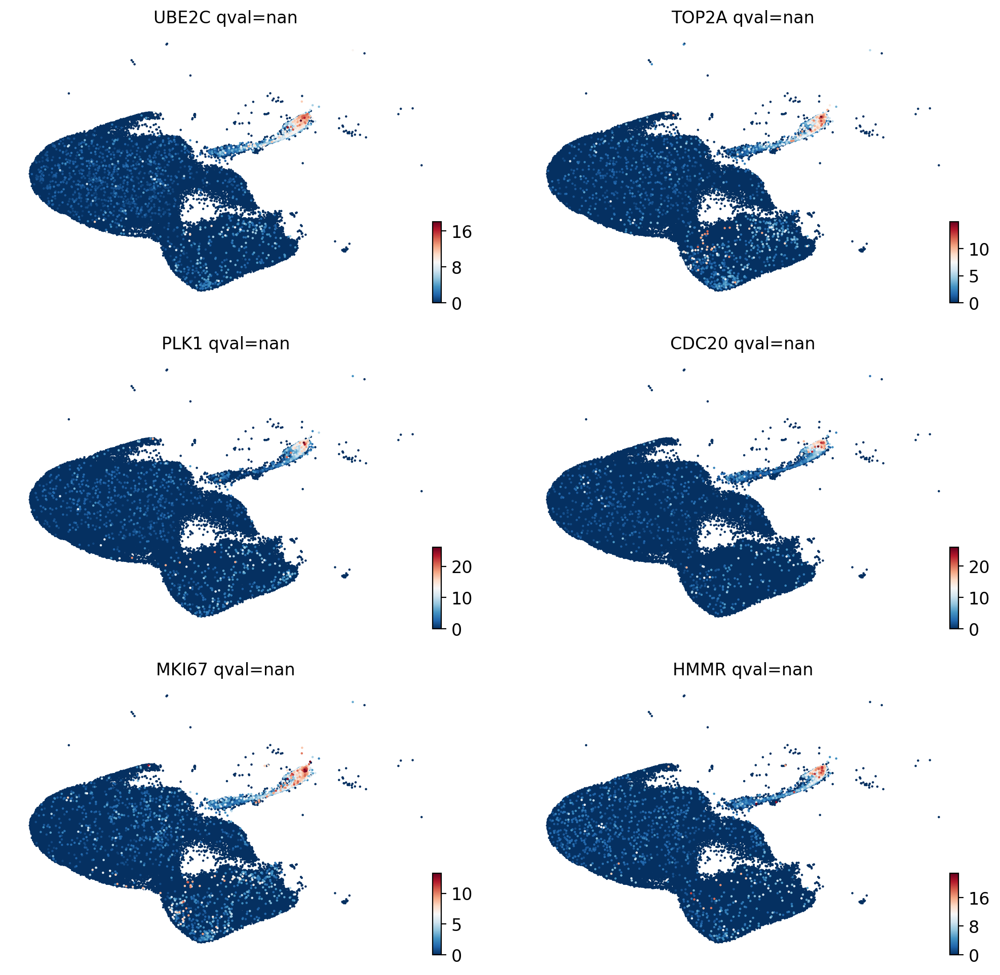

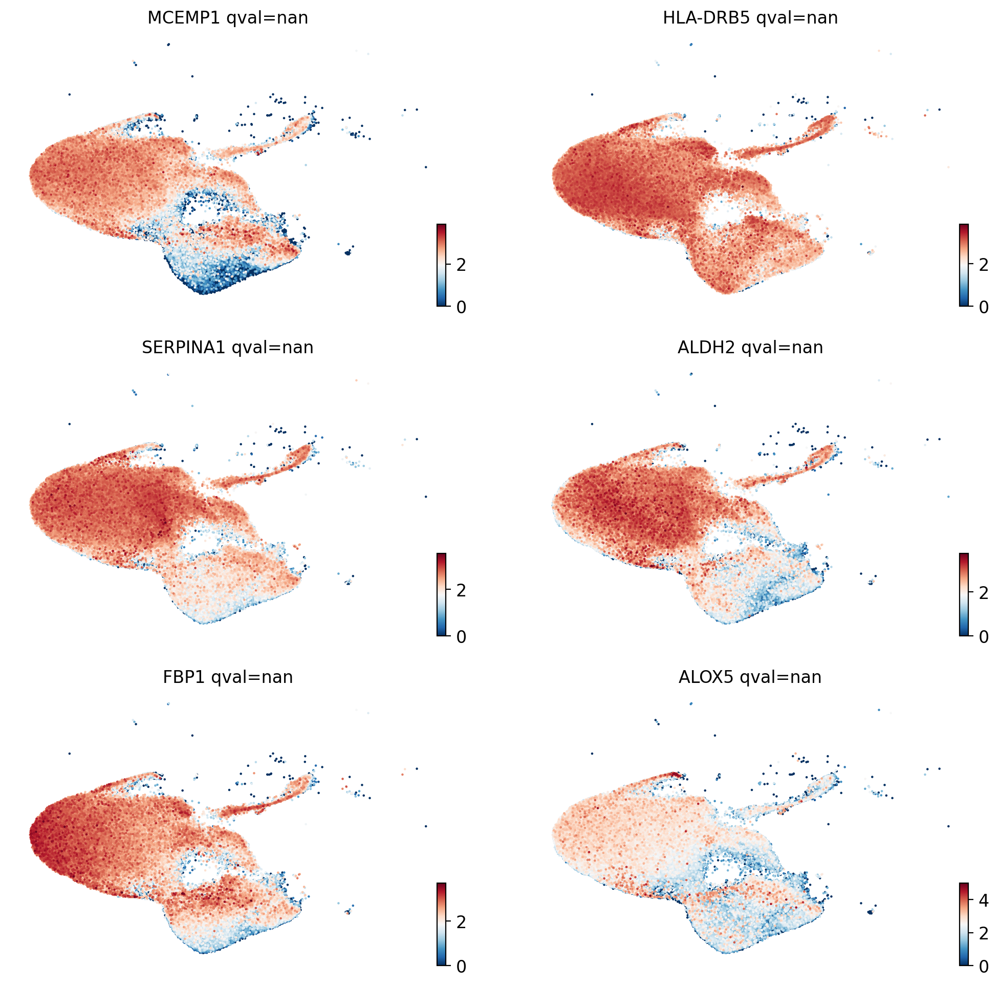

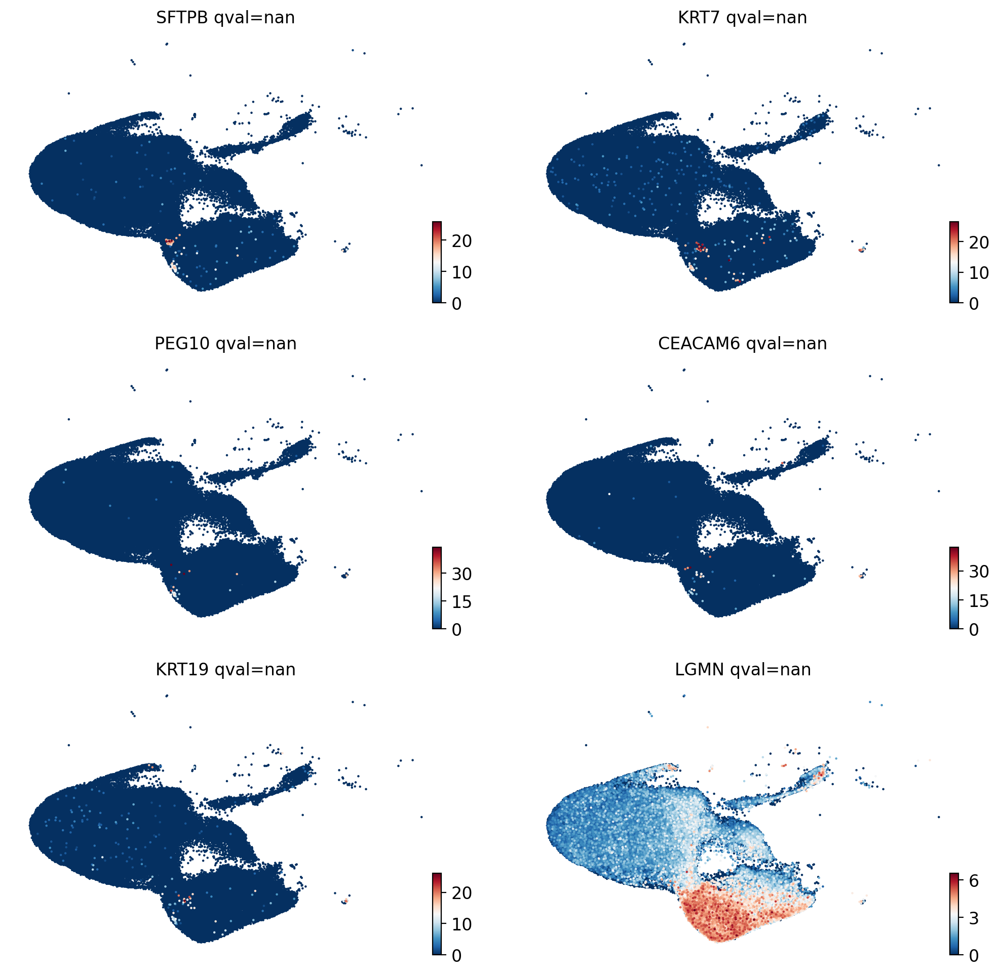

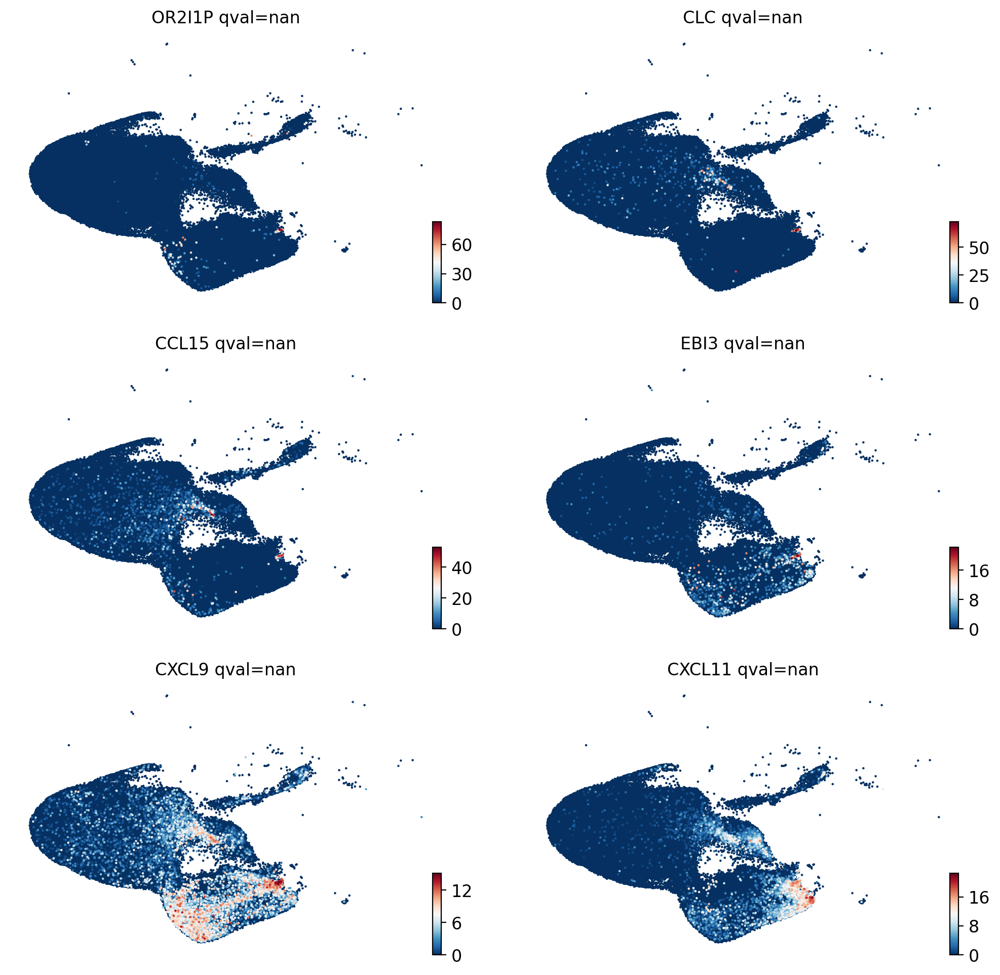

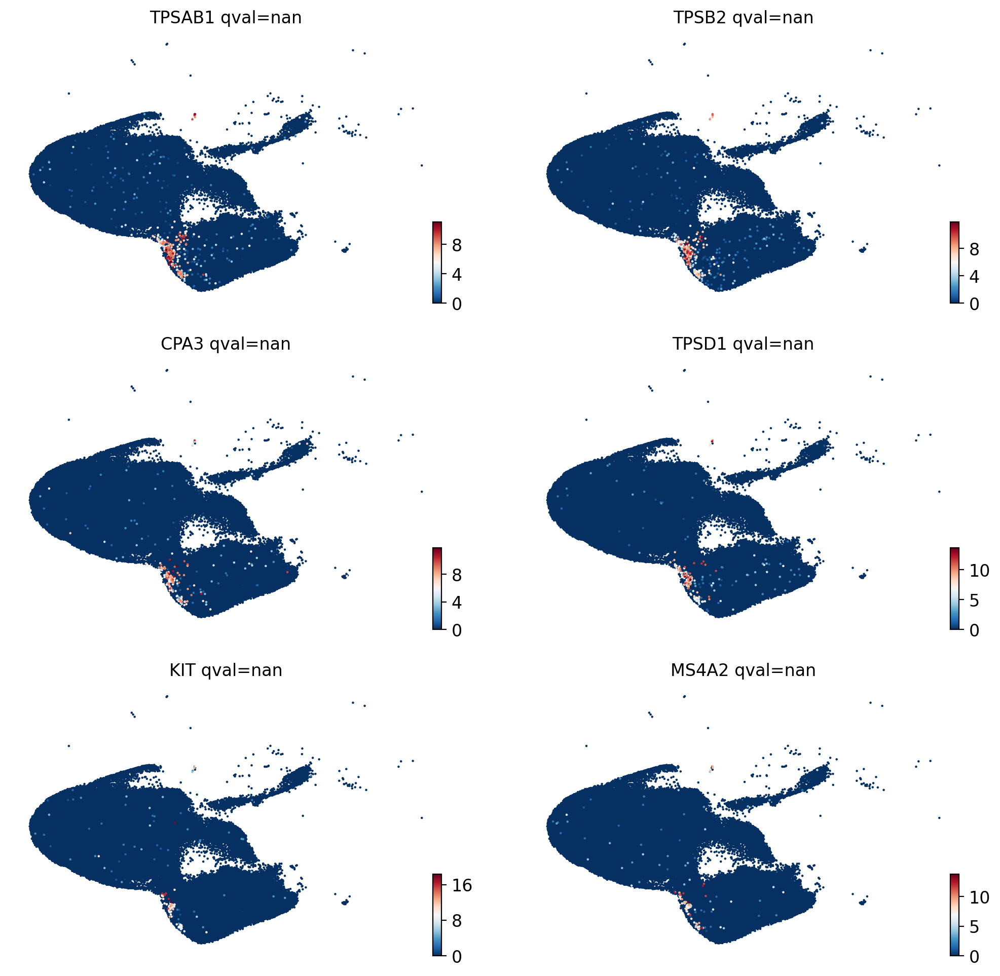

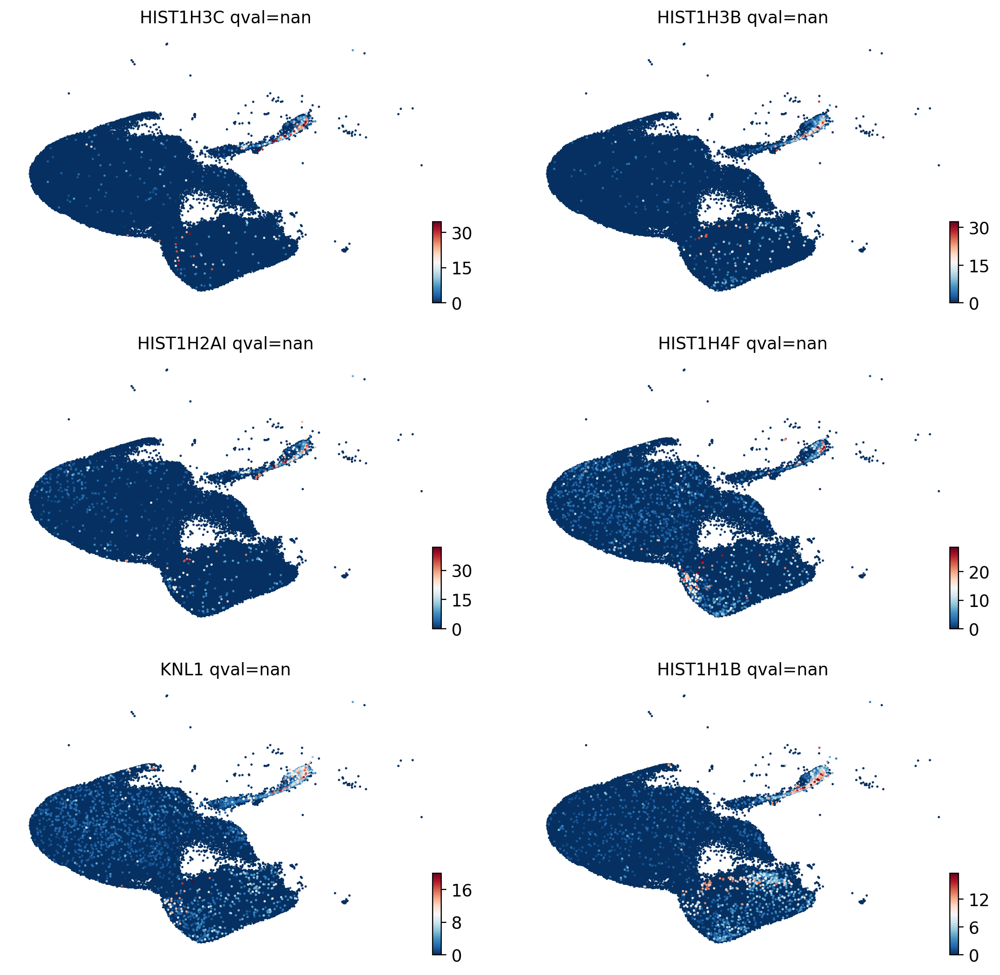

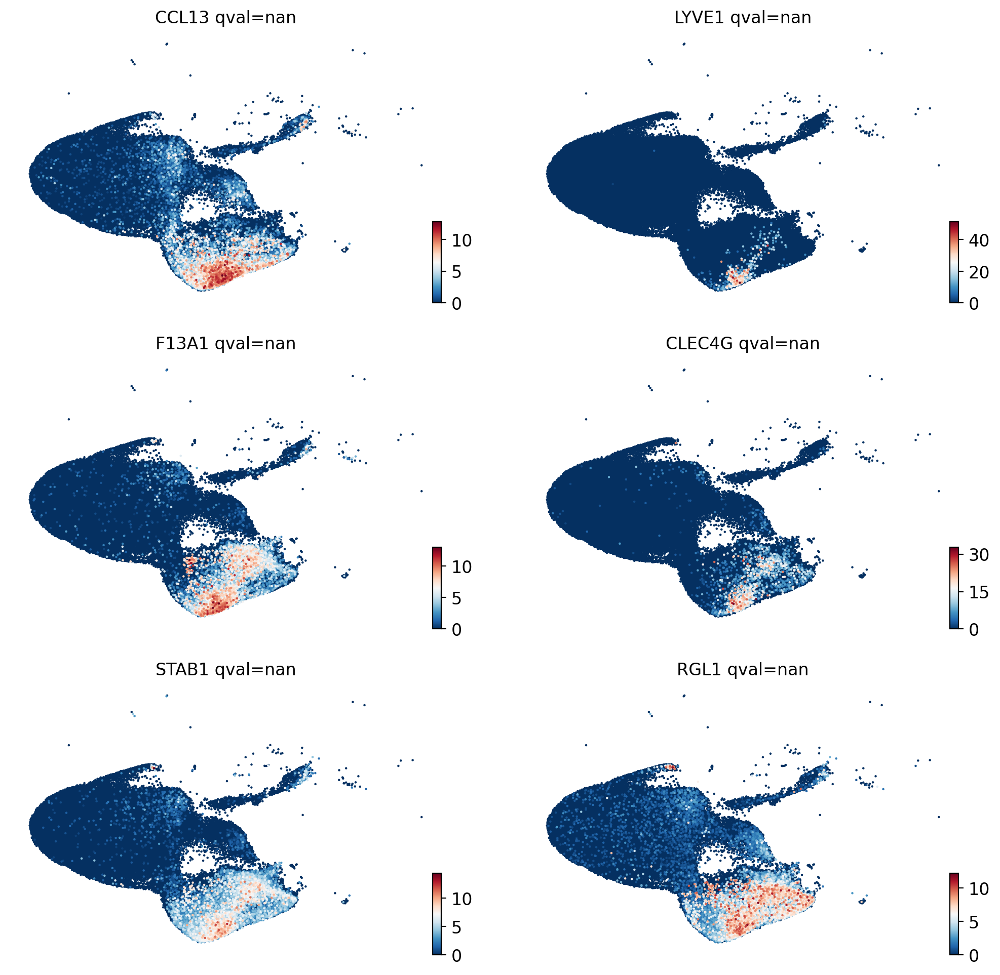

In [28]:
for te in Terminals:
    cr.pl.lineage_drivers(adata, lineage=te, n_genes=6,ncols=2)

In [29]:
Terminals = adata.obs['terminal_states'].unique().tolist()
Terminals.remove(np.nan)
top3_drivers = []
for te in Terminals:
    top3_drivers.extend(adata.varm['terminal_lineage_drivers'][te+"_corr"].sort_values(ascending=False).index[:1])


In [30]:
model = cr.ul.models.GAM(adata)

Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

    Finish (0:00:05)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

    Finish (0:00:03)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

    Finish (0:00:05)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

    Finish (0:01:21)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

    Finish (0:00:03)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

    Finish (0:02:08)


RuntimeError: Fatal model failure `<FailedModel[origin=GAM[gene='HIST1H3C', lineage='Resident macrophage_1', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0) + intercept, tol=0.0001, verbose=False)]]>`.

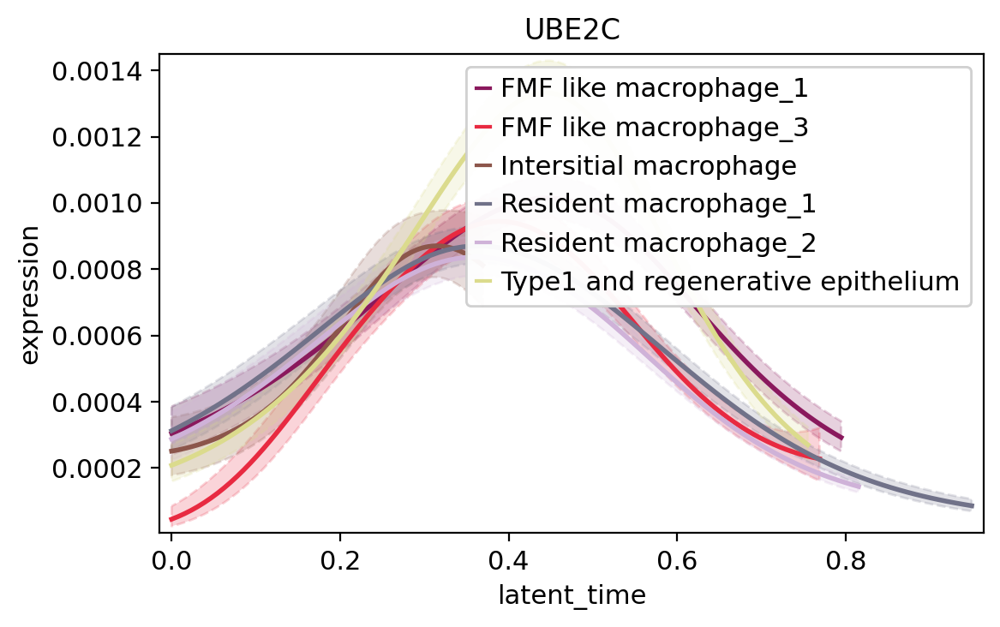

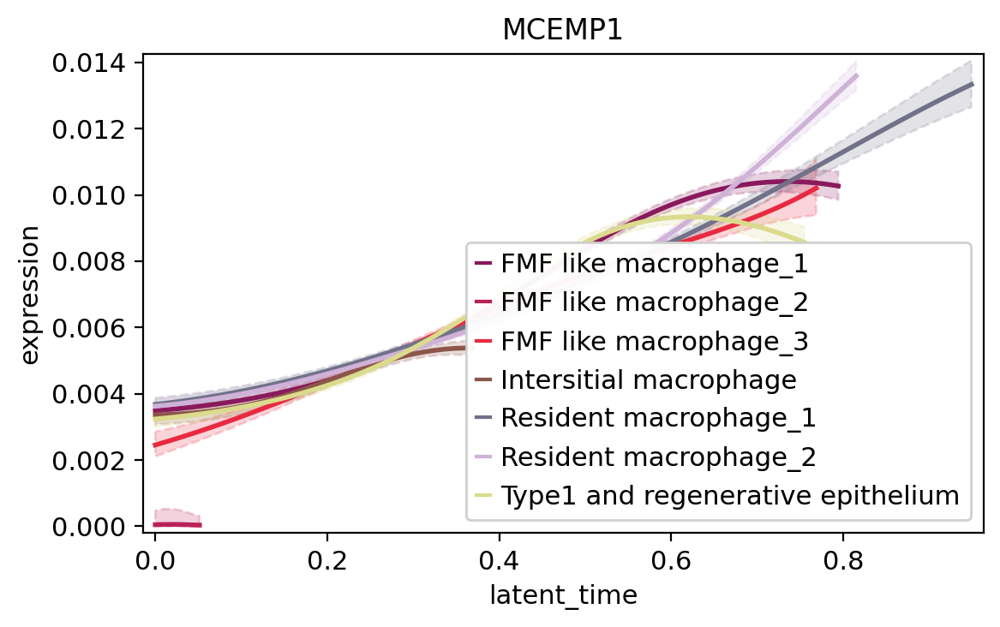

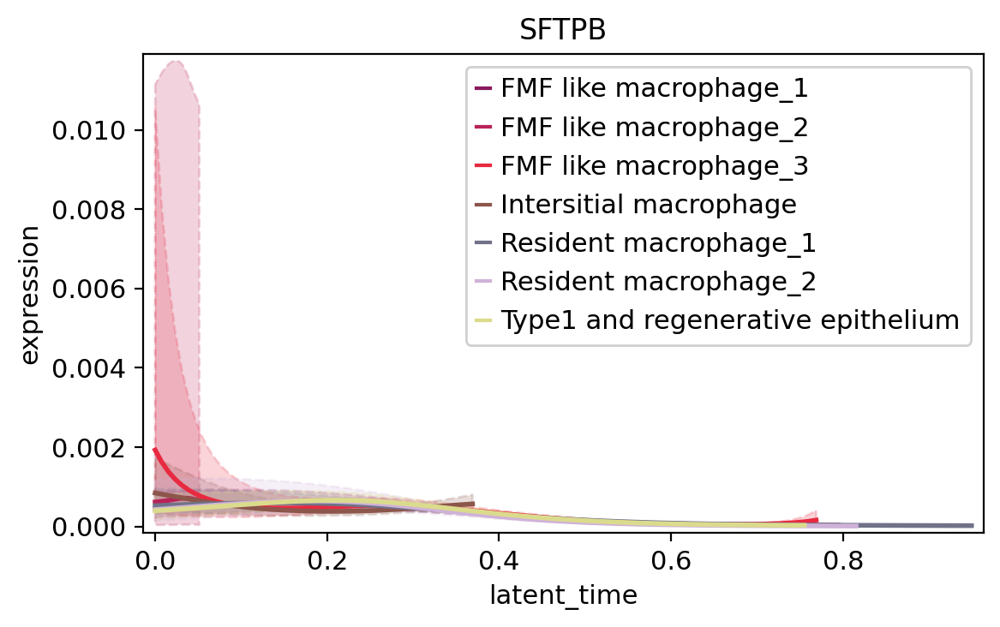

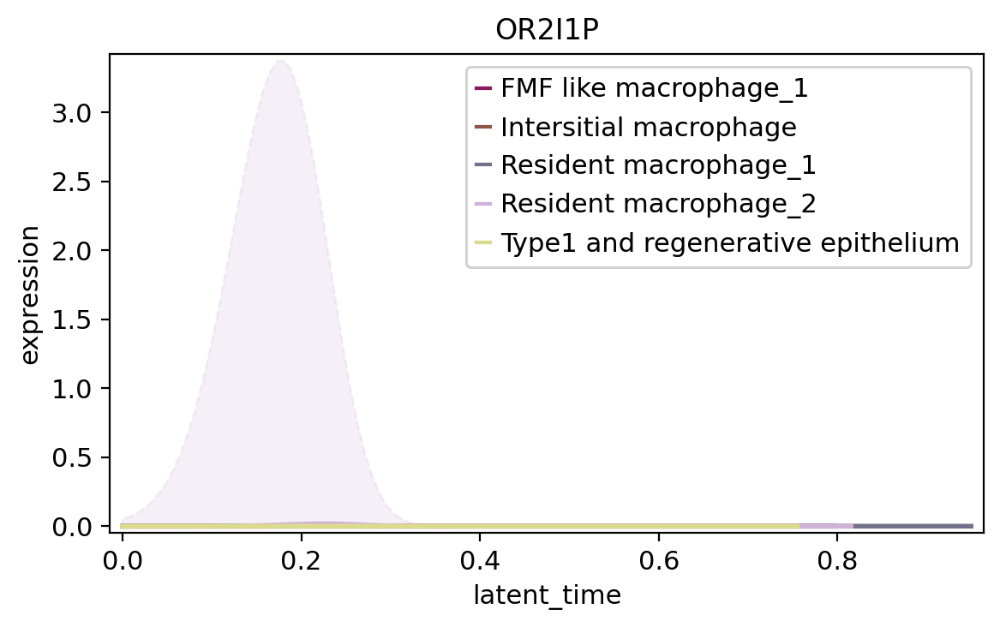

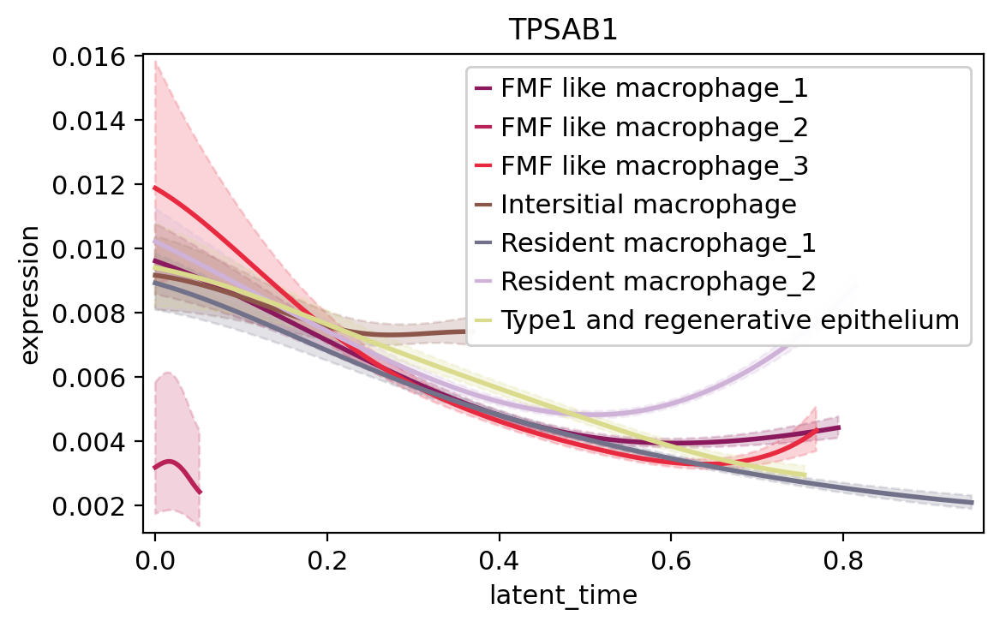

In [31]:
for i in range(len(top3_drivers)):    
    cr.pl.gene_trends(
        adata,
        model=model,
        data_key="Ms",
        genes=top3_drivers[i],
        ncols=3,
        time_key="latent_time",
        same_plot=True,
        hide_cells=True,
    n_jobs=24,    
    n_test_points=100,
    
)